In [1]:
import torch
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning import loggers
from pytorch_lightning import Trainer
import numpy as np
import pandas as pd

from net import SimpleNet
from net_lstm import SimpleLSTM
from net_transformer import SimpleTimeSeriesTransformer

from datamodule import Datamodule
from model import FlightModel

from file_parsing_utils import create_csv_dict
from coordinate_transform import CoordinateEnum, helper_get_coordinate_system_based_on_enum
from iterate_flights import itterate_flights, build_features, flight_tensor_chunk_itterator
from model import iterative_path_predict
from coordinate_transform import  haversine
from iterate_flights import flightpath_iterator

from glob import glob 
import copy
from collections import defaultdict

from folium_utils import create_folium_map
from folium_utils import get_map_image
import folium

from matplotlib import pyplot as plt
import matplotlib.image as mpimg


import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

In [2]:
import re
from glob import glob

def get_model_paths(experiment_name, models_dir=None, use_model_at_index = None):
    if models_dir is None:
        models_dir = '/Users/aleksandranikevich/Desktop/AircraftTrajectory/flight_pattern_of_life-main/models/'

    experiment_dir = models_dir + experiment_name + "/"
    models_dir = experiment_dir + "models/"
    paths = glob(models_dir + "*.ckpt")

    def extract_step_number(path):
        match = re.search(r"step=(\d+)", path)
        return int(match.group(1)) if match else float('inf')  # Use 'inf' for 'last.ckpt' to sort it last

    sorted_paths = sorted(paths, key=extract_step_number)

    # return specific desired model at a particular index if this parameter is specified
    if use_model_at_index is not None:
        return sorted_paths[use_model_at_index]
    return sorted_paths



from enum import Enum
import inspect

class NetEnum(Enum):
    SimpleCNN = 1
    SimpleLSTM = 2
    SimpleTimeSeriesTransformer = 3

    def __str__(self):
        return self.name


def filter_params(func, param_dict):
    sig = inspect.signature(func)
    return {k: v for k, v in param_dict.items() if k in sig.parameters}


def get_specific_eval_model(model_dictionary, experiment_name, models_dir=None, use_model_at_index=-2):
    dir_model = get_model_paths(experiment_name, models_dir=models_dir, use_model_at_index = use_model_at_index)
    

    # Coordinate System Initialization
    coordinate_dictionary = model_dictionary['coordinate_dictionary']

    coordinate_system_enum = coordinate_dictionary["CoordinateEnum"]     #CoordinateEnum.LatLongCoordinates
    coordinate_system = helper_get_coordinate_system_based_on_enum(coordinate_enum=coordinate_system_enum)
    auxiliary_input_channels = coordinate_dictionary["auxiliary_input_channels"]
    auxiliary_output_channels = coordinate_dictionary["auxiliary_output_channels"]

    len_coordinate_system  = len(coordinate_system)
    desired_input_features = coordinate_system  + auxiliary_input_channels
    desired_output_features = coordinate_system  + auxiliary_output_channels
    desired_features_input_and_output = coordinate_system  + auxiliary_input_channels + auxiliary_output_channels

    num_input_features = len(desired_input_features)
    num_output_features = len(desired_output_features)

    in_channels = len(coordinate_system) + len(auxiliary_input_channels)
    out_channels = len(coordinate_system)


    # Net Initialization
    net_enum = model_dictionary["NetEnum"]
    net_parameters = model_dictionary["net_parameters"]
    net_parameters["in_channels"] = in_channels
    net_parameters["out_channels"] = out_channels
    if net_enum == NetEnum.SimpleCNN:
        from net import SimpleNet

        params_for_init = filter_params(SimpleNet.__init__, net_parameters)
        net = SimpleNet(**params_for_init)
    
    elif net_enum == NetEnum.SimpleLSTM:
        from net_lstm import SimpleLSTM

        params_for_init = filter_params(SimpleLSTM.__init__, net_parameters)
        net = SimpleLSTM(**params_for_init)

    elif net_enum == NetEnum.SimpleTimeSeriesTransformer:
        from net_transformer import SimpleTimeSeriesTransformer

        params_for_init = filter_params(SimpleTimeSeriesTransformer.__init__, net_parameters)
        net = SimpleTimeSeriesTransformer(**params_for_init)

    else:
        raise NotImplementedError


    # Model Initialization
    model_params = model_dictionary["model_params"]
    model_params["checkpoint_path"] = dir_model
    model_params["model"] = net
    model_params["coordinate_system_enum"] = coordinate_system_enum
    model_simple_cnn = FlightModel.load_from_checkpoint(**model_params)

    return model_simple_cnn

    



In [3]:
coordinate_system_enum = CoordinateEnum.LatLongCoordinates

experiment_name_cnn = "test60"


num_output_rows = 1
num_res_blocks = 4
intermediate_channels = 64
dilation = [1 if i % 2 == 0 else 2 for i in range(num_res_blocks + 2)]
kernel_size = 27
use_bn_norm=False
stride=1
bias=True


map_location = 'cpu'
loss_fn = torch.nn.functional.mse_loss
optimizer = None 
max_num_val_maps = 8
n_future_timesteps = 10
mean = None
std = None


coordinate_dictionary = {}
coordinate_dictionary["CoordinateEnum"] = coordinate_system_enum
coordinate_dictionary["auxiliary_input_channels"] =  [
                                                        "diff_time", 
                                                        "flight_course_corrected", 
                                                        "flight_course_unknown", 
                                                    ]
coordinate_dictionary["auxiliary_output_channels"] = []


net_parameters_LSTM = {}
net_parameters_LSTM["intermediate_channels"] = intermediate_channels
net_parameters_LSTM["num_res_blocks"] = num_res_blocks
net_parameters_LSTM["num_output_rows"] = num_output_rows
net_parameters_LSTM["dilation"] = dilation
net_parameters_LSTM["kernel_size"] = kernel_size
net_parameters_LSTM["use_bn_norm"] = use_bn_norm
net_parameters_LSTM["stride"] = stride
net_parameters_LSTM["bias"] = bias


model_params = {}
model_params["map_location"] = map_location
model_params["loss_fn"] = loss_fn
model_params["optimizer"] = optimizer
model_params["max_num_val_maps"] = max_num_val_maps
model_params["n_future_timesteps"] = n_future_timesteps
model_params["mean"] = mean
model_params["std"] = std


model_dictionary = {}
model_dictionary["coordinate_dictionary"] = coordinate_dictionary
model_dictionary["NetEnum"] = NetEnum.SimpleCNN
model_dictionary["net_parameters"] = net_parameters_LSTM
model_dictionary["model_params"] = model_params

model = get_specific_eval_model(model_dictionary, experiment_name=experiment_name_cnn, models_dir=None, use_model_at_index=-2)



debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False


KeyError: <CoordinateEnum.LatLongCoordinates: 1>

In [ ]:
models_dir = '/Users/aleksandranikevich/Desktop/AircraftTrajectory/flight_pattern_of_life-main/models/'


In [4]:
coordinate_dictionary = model_dictionary['coordinate_dictionary']

coordinate_system_enum = coordinate_dictionary["CoordinateEnum"]     #CoordinateEnum.LatLongCoordinates
coordinate_system = helper_get_coordinate_system_based_on_enum(coordinate_enum=coordinate_system_enum)
auxiliary_input_channels = coordinate_dictionary["auxiliary_input_channels"]
auxiliary_output_channels = coordinate_dictionary["auxiliary_output_channels"]

num_workers = 1
num_input_rows_total = 100
min_rows_input = 100
num_output_rows = 1


individual_flights_dir = "/Users/aleksandranikevich/Desktop/AircraftTrajectory/data/Individual_Flights/"
flight_dfs = create_csv_dict(individual_flights_dir)

datamodule = Datamodule(all_flight_dataframes_dict = flight_dfs, 
                        num_input_rows_total = num_input_rows_total, 
                        min_rows_input = min_rows_input, 
                        num_output_rows = 1, 
                        coordinate_system_enum = coordinate_system_enum,
                        auxiliary_input_channels = auxiliary_input_channels,
                        auxiliary_output_channels = auxiliary_output_channels,
                        train_prop = 0.8, 
                        batch_size = 32, 
                        num_workers = num_workers, 
                        pin_memory = True,)

train_dataloader = datamodule.train_dataloader()
test_dataloader = datamodule.test_dataloader()

# dummy tensor
test_dataloader_iterator = test_dataloader.__iter__()
tensors_dict = next(test_dataloader_iterator)





desired_keys = ['150171', '164344', '123483', '90107', '134434', '146014', '180338', '68524', '89816']
eval_flights_dfs = {key: flight_dfs[key] for key in desired_keys if key in flight_dfs}

flight_dictionary_pre_loaded = False

num_predict_steps = 10
len_coordinate_system  = len(coordinate_system)
desired_input_features = coordinate_system  + auxiliary_input_channels
desired_output_features = coordinate_system  + auxiliary_output_channels
flightpath_iter = flightpath_iterator(flights_dict=eval_flights_dfs, 
                        flight_dictionary_pre_loaded=flight_dictionary_pre_loaded, 
                        desired_input_features=desired_input_features, 
                        desired_output_features=desired_output_features, 
                        min_rows_input=min_rows_input, 
                        num_input_rows_total=num_input_rows_total, 
                        num_output_rows=num_predict_steps, 
                        len_coordinate_system=len_coordinate_system, 
                        shuffle_flights = False, 
                        shuffle_chunks = False, 
                        bool_yield_meta_flightpath = True, 
                        force_new_flightpath_every_val_step = False
                        )

In [98]:
def eval_over_flightpaths(some_model_list, flightpath_iter, num_predict_steps, break_after_index = None, models_names_list = None):

    if not isinstance(some_model_list, list):
        some_model_list = [some_model_list]

    results_dict = defaultdict(lambda: defaultdict(list))
    flightpaths = {}

    idx_flight = 0
    for idx_iter, d in enumerate(flightpath_iter):
        if d is None:
            break

        msn = d['meta_msn']
        flight_id = d['meta_flight_id']
        if (msn, flight_id) not in flightpaths:

            idx_flight += 1
            if break_after_index is not None:
                if idx_flight >= break_after_index:
                    break

            flightpaths[(msn, flight_id)] = copy.deepcopy(d['meta_flightpath'])

        # dict_keys(['input_tensor', 'output_tensor', 'zero_pad_rows', 'chunk_index', 'normalization_tensor', 'meta_flightpath', 'meta_msn', 'meta_flight_id'])
        input_tensor = d["input_tensor"]
        output_tensor = d["output_tensor"]

        input_tensor = torch.unsqueeze(input_tensor, dim=0)
        d["input_tensor"] = input_tensor

        # Iterate over all models that were passed in
        for index_model, some_model in enumerate(some_model_list):
            pass_in_dict = {"input_tensor": d["input_tensor"].clone(), "normalization_tensor": d["normalization_tensor"].clone()}
            iterative_predictions_tensor_np1 = iterative_path_predict(batch_dict=pass_in_dict, 
                                                                    model=some_model, 
                                                                    coordinate_system_enum=coordinate_system_enum, 
                                                                    num_predict_steps=num_predict_steps, 
                                                                    bool_normalize_center = True, 
                                                                    bool_with_eval_model = True
                                                                    )

            prediction_model_str = "prediction_model_" + str(index_model)
            if models_names_list is not None:
                prediction_model_str = models_names_list[index_model]
                
            results_dict[(msn, flight_id)][prediction_model_str].append(iterative_predictions_tensor_np1)

        results_dict[(msn, flight_id)]['chunk_index'].append(d['chunk_index'])
        results_dict[(msn, flight_id)]['ground_truth'].append(output_tensor.detach().cpu().numpy())

    print("idx iter: ", idx_iter)
    return results_dict, flightpaths

In [99]:
eval_dict, flightpaths = eval_over_flightpaths(model, flightpath_iter, num_predict_steps, break_after_index = 2)

idx iter:  5392


/Users/aleksandranikevich/Desktop/AircraftTrajectory/REPO/flight_pattern_of_life/iterate_flights.py:139: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  new_flight_df[aux_columns] = new_flight_df[aux_columns].fillna(method='ffill')


In [32]:
eval_dict[list(eval_dict.keys())[0]].keys()

dict_keys(['prediction_model_0', 'chunk_index', 'ground_truth'])

In [10]:
flightpaths

{('150171',
  'SKW5664'):             Time   Unnamed: 0    fltKey    CID     UAID   Latitude  Longitude  \
 0     1716076079  164444910.0  150171.0  656.0  SKW5664  41.973350 -87.904370   
 1     1716076080  164444910.0  150171.0  656.0  SKW5664  41.973320 -87.904400   
 2     1716076081  164444912.0  150171.0  656.0  SKW5664  41.973290 -87.904430   
 3     1716076082  164444912.0  150171.0  656.0  SKW5664  41.973286 -87.904430   
 4     1716076083  164444912.0  150171.0  656.0  SKW5664  41.973281 -87.904430   
 ...          ...          ...       ...    ...      ...        ...        ...   
 3167  1716079246  164445679.0  150171.0  656.0  SKW5664  43.541066 -84.069238   
 3168  1716079247  164445679.0  150171.0  656.0  SKW5664  43.540642 -84.069836   
 3169  1716079248  164445679.0  150171.0  656.0  SKW5664  43.540218 -84.070434   
 3170  1716079249  164445679.0  150171.0  656.0  SKW5664  43.539794 -84.071032   
 3171  1716079250  164445680.0  150171.0  656.0  SKW5664  43.539370 -84.0

In [11]:
len(eval_dict[list(eval_dict.keys())[0]]['prediction_model_0'])

3061

In [12]:
eval_dict[list(eval_dict.keys())[0]]['prediction_model_0'][0] #.shape : (1, 2, 10)

array([[[ 41.972595,  41.972588,  41.97258 ,  41.97257 ,  41.97256 ,
          41.972553,  41.972546,  41.972538,  41.97253 ,  41.97252 ],
        [-87.90442 , -87.90442 , -87.90442 , -87.90442 , -87.90442 ,
         -87.90442 , -87.90442 , -87.90442 , -87.90441 , -87.90441 ]]],
      dtype=float32)

In [13]:
eval_dict[list(eval_dict.keys())[0]]['ground_truth'][0].shape

(2, 10)

In [61]:

def get_final_eval_metrics_all_models(eval_dict, flightpaths_dict):
    """
    *Currently assumes Lat-Long coordinates
    """


    paths_we_evaled_keys_list = list(eval_dict.keys())
    models_and_other = list(eval_dict[paths_we_evaled_keys_list[0]].keys()) # Ex: dict_keys(['prediction_model_0', 'chunk_index', 'ground_truth'])
    all_model_keys = [model_name for model_name in models_and_other if "prediction_model_" in model_name]

    dict_overall_eval = {}
    dict_overall_eval_arrays = {}
    for flightpath_key in paths_we_evaled_keys_list:

        flightpath_dataframe = flightpaths_dict[flightpath_key]
        flightpath_np = flightpath_dataframe[["Latitude", "Longitude"]].to_numpy()
        flightpath_np = np.squeeze(flightpath_np)

        ground_truth_list = eval_dict[flightpath_key]["ground_truth"]
        num_samples = len(ground_truth_list)

        #dict_disance_overall = {model_key: 0.0 for model_key in all_model_keys}
        dict_errors = {model_key: defaultdict(float) for model_key in all_model_keys}
        dict_errors_arrs = {model_key: defaultdict(list) for model_key in all_model_keys}

        for sample_index in range(num_samples):
            for model_key in all_model_keys:
                ground_truth_array = eval_dict[flightpath_key]["ground_truth"][sample_index]
                model_prediction_array = eval_dict[flightpath_key][model_key][sample_index]
                ground_truth_array = np.squeeze(ground_truth_array)
                model_prediction_array = np.squeeze(model_prediction_array)

                # Sometimes there are no more samples in the ground truth array, we must then ignore the corresponding predictions
                if ground_truth_array.shape != model_prediction_array.shape:
                    continue

                error_distance_arr = haversine(ground_truth_array[0], ground_truth_array[1], model_prediction_array[0], model_prediction_array[1])

                error_distance_total = np.sum(error_distance_arr)
                dict_errors[model_key]["error_distance_overall"] += error_distance_total
                dict_errors_arrs[model_key]["error_distance_arr"].append(error_distance_arr)


                # Normalized errors
                chunk_idx = eval_dict[flightpath_key]["chunk_index"][sample_index] - 1
                current_position = flightpath_np[chunk_idx]
                current_lat = current_position[0]
                current_long = current_position[1]
                distance_traveled_arr = haversine(current_lat, current_long, ground_truth_array[0], ground_truth_array[1])
                
                normalized_error_arr = error_distance_arr / distance_traveled_arr
                # sometimes the distance traveled to the next timestep is insignificant, we want to filter NaNs and Infs that are caused by this
                normalized_error_arr = np.nan_to_num(normalized_error_arr, nan=0.0, posinf=0.0, neginf=0.0)

                if np.isinf(normalized_error_arr).any() or np.isnan(normalized_error_arr).any():
                    print('\n\n')
                    print("current_lat, current_long, ground_truth_array[0], ground_truth_array[1]: ", current_lat, current_long, ground_truth_array[0], ground_truth_array[1])
                    print("distance_traveled_arr: ", distance_traveled_arr)
                    print("normalized_error_arr: ", normalized_error_arr)

                error_distance_overall_normalized = np.sum(normalized_error_arr)
                dict_errors[model_key]["error_distance_overall_normalized"] += error_distance_overall_normalized
                dict_errors_arrs[model_key]["normalized_error_arr"].append(normalized_error_arr)

                _, num_predictions = ground_truth_array.shape
                dict_errors[model_key]["num_predictions_total"] += num_predictions

                mse_error_arr = 0.5*((ground_truth_array[0] - current_lat)**2.0 + (ground_truth_array[1] - current_long)**2.0)
                dict_errors[model_key]["mse_error_arr"] += np.sum(mse_error_arr)
                dict_errors_arrs[model_key]["mse_error_arr"].append(mse_error_arr)

                

        ###dict_errors_arrs = {key: np.stack(arr_list, axis=0) for key, arr_list in dict_errors_arrs.items()}

        dict_overall_eval[flightpath_key] = dict_errors
        dict_overall_eval_arrays[flightpath_key] = dict_errors_arrs

    
    return dict_overall_eval, dict_overall_eval_arrays



dict_overall_eval, dict_overall_eval_arrays = get_final_eval_metrics_all_models(eval_dict, flightpaths_dict=flightpaths)
dict_overall_eval_arrays
                




/var/folders/3v/j_z4lh492653rkrwnbw6_p6w0000gn/T/ipykernel_67414/1016356618.py:51: RuntimeWarning: divide by zero encountered in divide
  normalized_error_arr = error_distance_arr / distance_traveled_arr
/var/folders/3v/j_z4lh492653rkrwnbw6_p6w0000gn/T/ipykernel_67414/1016356618.py:51: RuntimeWarning: invalid value encountered in divide
  normalized_error_arr = error_distance_arr / distance_traveled_arr


{('150171',
  'SKW5664'): {'prediction_model_0': defaultdict(list,
              {'error_distance_arr': [array([0.00075948, 0.00151896, 0.00265819, 0.00379741, 0.00455689,
                       0.00531638, 0.0064556 , 0.00683534, 0.00761579, 0.00875228],
                      dtype=float32),
                array([0.00075948, 0.00151896, 0.00265819, 0.00341767, 0.00417715,
                       0.00493664, 0.00531638, 0.0064556 , 0.00721508, 0.00797457],
                      dtype=float32),
                array([0.00075948, 0.00151896, 0.00189871, 0.00303793, 0.00379741,
                       0.00417715, 0.00493664, 0.00531638, 0.0064556 , 0.00721508],
                      dtype=float32),
                array([0.00075948, 0.00113922, 0.00189871, 0.00303793, 0.00303793,
                       0.00379741, 0.00455689, 0.00493664, 0.00607586, 0.00683534],
                      dtype=float32),
                array([0.00075948, 0.00113922, 0.00189871, 0.00227845, 0.00303793,
        

In [71]:
#dict_overall_eval_arrays.keys() # '150171', 'SKW5664'
dict_overall_eval_arrays[('150171', 'SKW5664')]['prediction_model_0'].keys() # dict_keys(['error_distance_arr', 'normalized_error_arr', 'mse_error_arr'])
dict_overall_eval_arrays[('150171', 'SKW5664')]['prediction_model_0']['normalized_error_arr'][0].shape

(10,)

In [84]:
def get_overall_error_metrics(dict_overall_eval, dict_overall_eval_arrays):
    # first get overall metrics averaged out over all evaluations
    path_keys = list(dict_overall_eval.keys())
    model_keys = list(dict_overall_eval[path_keys[0]].keys())
    eval_metric_keys = list(dict_overall_eval[path_keys[0]][model_keys[0]])

    final_metrics_dict = defaultdict(lambda: defaultdict(float)) # averaged over all paths METRICS 
    num_paths = len(path_keys)
    for path_key in path_keys:
        for model_key in model_keys:
            for eval_metric_key in eval_metric_keys:
                if eval_metric_key == 'num_predictions_total':
                    continue
                num_predictions_total = dict_overall_eval[path_key][model_key]['num_predictions_total']
                inverse_num_paths = (1.0/num_paths)
                inverse_num_preditions_total = (1.0/num_predictions_total)
                final_metrics_dict[model_key][eval_metric_key] += inverse_num_paths *inverse_num_preditions_total * dict_overall_eval[path_key][model_key][eval_metric_key]

    # final result of this is nested dict of [model][eval_metric] with final metrics
    
    path_keys = list(dict_overall_eval_arrays.keys())
    model_keys = list(dict_overall_eval_arrays[path_keys[0]].keys())
    eval_metric_keys = list(dict_overall_eval_arrays[path_keys[0]][model_keys[0]])
    num_future_steps = dict_overall_eval_arrays[path_keys[0]][model_keys[0]][eval_metric_keys[0]][0].shape[0] # shape of the first array stored in this arrays nested dict
    final_array_metrics_dict = defaultdict(lambda: defaultdict(lambda: np.zeros(num_future_steps)))
    final_array_counts_dict = defaultdict(lambda: defaultdict(float))

    for path_key in path_keys:
        for model_key in model_keys:
            for eval_metric_key in eval_metric_keys:
                path_predictions_list_from_model = dict_overall_eval_arrays[path_key][model_key][eval_metric_key]
                for path in path_predictions_list_from_model:
                    # Each path is a numpy array
                    final_array_metrics_dict[model_key][eval_metric_key] += path
                    final_array_counts_dict[model_key][eval_metric_key] += 1.0

    for model_key in model_keys:
        for eval_metric_key in eval_metric_keys:
            sum_of_all_predictions_array = final_array_metrics_dict[model_key][eval_metric_key]
            num_predictions = final_array_counts_dict[model_key][eval_metric_key]
            final_array_metrics_dict[model_key][eval_metric_key] = sum_of_all_predictions_array / num_predictions

    return final_metrics_dict, final_array_metrics_dict
    

final_metrics_dict, final_array_metrics_dict = get_overall_error_metrics(dict_overall_eval, dict_overall_eval_arrays)

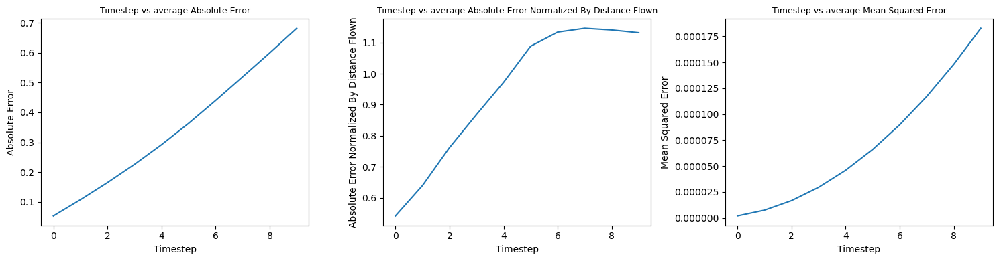

In [97]:
import matplotlib.pyplot as plt

def plot_metrics_from_dict(results_dict):
    model_keys = list(results_dict.keys())
    metric_keys = list(results_dict[model_keys[0]].keys())
    
    # Custom labels
    labels = {
        'error_distance_arr': "Absolute Error",
        'normalized_error_arr': "Absolute Error Normalized By Distance Flown",
        'mse_error_arr': "Mean Squared Error"
    }
    
    n_rows = len(model_keys)
    n_cols = len(metric_keys)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
    
    for i, model_key in enumerate(model_keys):
        for j, metric_key in enumerate(metric_keys):
            ax = axes[i, j] if n_rows > 1 and n_cols > 1 else axes[max(i, j)]
            metric_array = results_dict[model_key][metric_key]
            ax.plot(metric_array)
            ax.set_xlabel("Timestep")
            ax.set_ylabel(labels.get(metric_key, metric_key))  # Use custom label or fallback to key
            ax.set_title(f"Timestep vs average {labels.get(metric_key, metric_key)}", fontsize=9)
    
    plt.tight_layout()
    #plt.show()
    return fig



    

fig = plot_metrics_from_dict(final_array_metrics_dict)

In [86]:
final_metrics_dict

defaultdict(<function __main__.get_overall_error_metrics.<locals>.<lambda>()>,
            {'prediction_model_0': defaultdict(float,
                         {'error_distance_overall': 0.3446108531453901,
                          'error_distance_overall_normalized': 0.9424083959078797,
                          'mse_error_arr': 7.051190192771372e-05})})

In [85]:
final_array_metrics_dict

defaultdict(<function __main__.get_overall_error_metrics.<locals>.<lambda>()>,
            {'prediction_model_0': defaultdict(<function __main__.get_overall_error_metrics.<locals>.<lambda>.<locals>.<lambda>()>,
                         {'error_distance_arr': array([0.05244667, 0.10680887, 0.16440291, 0.22566888, 0.29183549,
                                 0.3632141 , 0.44008978, 0.51964074, 0.59977274, 0.68222836]),
                          'normalized_error_arr': array([0.54174662, 0.63956045, 0.76205496, 0.86840785, 0.97211687,
                                 1.08830849, 1.13372376, 1.14598997, 1.14049815, 1.13167684]),
                          'mse_error_arr': array([1.87241249e-06, 7.41154991e-06, 1.66056057e-05, 2.94426974e-05,
                                 4.59145114e-05, 6.60165038e-05, 8.97494287e-05, 1.17127019e-04,
                                 1.48152529e-04, 1.82826769e-04])})})

In [74]:
from collections import defaultdict

# Create a nested defaultdict
nested_default_dict = defaultdict(lambda: defaultdict(float))

# Example usage
nested_default_dict['outer_key1']['inner_key1'] += 1.5
nested_default_dict['outer_key2']['inner_key2'] += 2.5

print(nested_default_dict)



defaultdict(<function <lambda> at 0x3249cf7e0>, {'outer_key1': defaultdict(<class 'float'>, {'inner_key1': 1.5}), 'outer_key2': defaultdict(<class 'float'>, {'inner_key2': 2.5})})


In [54]:
flightpaths.keys()

dict_keys([('150171', 'N9803H'), ('164344', 'EJA151')])

In [76]:
import matplotlib.pyplot as plt
import numpy as np

def generate_colors(n):
    cmap = plt.cm.get_cmap('viridis', n)
    colors = [cmap(i) for i in range(cmap.N)]
    # Convert RGBA to hexadecimal for Folium
    hex_colors = [mcolors.to_hex(c[:3]) for c in colors]
    return hex_colors, colors

def eval_mapmaker(flightpath, eval_dict_at_flightpath = None, corresponding_color_list = None):
    flightpath_compleate = flightpath[["Latitude", "Longitude"]].to_numpy()
    min_lat, max_lat = np.min(flightpath_compleate[:, 0]), np.max(flightpath_compleate[:, 0])
    min_long, max_long = np.min(flightpath_compleate[:, 1]), np.max(flightpath_compleate[:, 1])

    m = create_folium_map(min_lat, min_long, max_lat, max_long, border_lat_prop=0.15, border_long_prop=0.03, tiles=None)
    folium.PolyLine(locations=flightpath_compleate, color='black', weight=2.5, opacity=1).add_to(m)

    if eval_dict_at_flightpath is None:
        return m
    
    model_keys = list(eval_dict_at_flightpath.keys())
    # Have to filter because thse keys will contain for example: dict_keys(['prediction_model_0', 'chunk_index', 'ground_truth'])
    model_keys = [model_name for model_name in model_keys if "prediction_model_" in model_name]

    if corresponding_color_list is None:
        # generate default color list
        N = len(model_keys)
        hex_colors, rgba_colors = generate_colors(N)
        corresponding_color_list = hex_colors
    
    for idx_model_key, model_predictions_key in enumerate(model_keys):
        model_predictions_list = eval_dict_at_flightpath[model_predictions_key]
        model_predictions_color = corresponding_color_list[idx_model_key]
        #print("debug model_predictions_key: ", model_predictions_key)
        for model_prediction in model_predictions_list:
            model_prediction = np.squeeze(model_prediction) # just in case we have [1 x ...] dimensionality
            #print("debug model prediction: ", model_prediction, type(model_prediction))
            #print(model_prediction.shape)
            folium.PolyLine(locations=model_prediction.T, color=model_predictions_color, weight=1.5, opacity=1).add_to(m)

    return m, corresponding_color_list




        


    
flightpath_key_example = ('150171', 'N9803H')
m, _ = eval_mapmaker(flightpath=flightpaths[flightpath_key_example], eval_dict_at_flightpath=eval_dict[flightpath_key_example])
m

/var/folders/3v/j_z4lh492653rkrwnbw6_p6w0000gn/T/ipykernel_16736/2272096475.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis', n)


In [72]:
eval_dict_at_fligthpath = eval_dict_at_flightpath=eval_dict[flightpath_key_example]
key = 'prediction_model_0'

predictions = eval_dict_at_flightpath[key]
num_correct = 0
for pred in predictions:
    if not isinstance(pred, np.int64):
        print(pred)
    else:
        num_correct += 1

print("num correct: ", num_correct)

[[[ 29.163586  29.162952  29.162312  29.161661  29.161001  29.16033
    29.159649  29.158955  29.15825   29.157532]
  [-81.07981  -81.07997  -81.08014  -81.080315 -81.08049  -81.08066
   -81.080826 -81.08099  -81.08116  -81.08132 ]]]
[[[ 29.163118  29.162489  29.161852  29.161205  29.16055   29.159882
    29.159204  29.158516  29.157814  29.1571  ]
  [-81.08007  -81.08024  -81.080414 -81.0806   -81.08077  -81.08095
   -81.08112  -81.08129  -81.08147  -81.08164 ]]]
[[[ 29.162657  29.162037  29.16141   29.160776  29.160133  29.159483
    29.158821  29.158152  29.15747   29.156778]
  [-81.08034  -81.08053  -81.08072  -81.08091  -81.0811   -81.08129
   -81.08148  -81.08167  -81.08186  -81.082054]]]
[[[ 29.16217   29.161552  29.160929  29.160297  29.159658  29.159008
    29.15835   29.157682  29.157003  29.156313]
  [-81.08061  -81.0808   -81.081    -81.08119  -81.0814   -81.08159
   -81.08179  -81.081985 -81.08218  -81.082375]]]
[[[ 29.161682  29.161068  29.160444  29.159817  29.159178  29

In [ ]:
tuple_key = list(results_dict.keys())[0]

color_cnn = "blue"
color_lstm = "orange"
color_transformer = 'green'



flightpath_compleate = flightpaths[tuple_key][["Latitude", "Longitude"]].to_numpy()
min_lat, max_lat = np.min(flightpath_compleate[:, 0]), np.max(flightpath_compleate[:, 0])
min_long, max_long = np.min(flightpath_compleate[:, 1]), np.max(flightpath_compleate[:, 1])

m = create_folium_map(min_lat, min_long, max_lat, max_long, border_lat_prop=0.15, border_long_prop=0.03, tiles=None) #"Cartodb dark_matter")
folium.PolyLine(locations=flightpath_compleate, color='black', weight=2.5, opacity=1).add_to(m)


num_predictions = len(results_dict[tuple_key]["prediction_cnn"])
for idx_pred in range(30, num_predictions, 10):
    cnn_prediction = results_dict[tuple_key]["prediction_cnn"][idx_pred][0]
    lstm_prediction = results_dict[tuple_key]["prediction_lstm"][idx_pred][0]
    transformer_prediction = results_dict[tuple_key]["prediction_trasformer"][idx_pred][0]

    folium.PolyLine(locations=cnn_prediction.T, color=color_cnn, weight=2.5, opacity=1).add_to(m)
    folium.PolyLine(locations=lstm_prediction.T, color=color_lstm, weight=2.5, opacity=1).add_to(m)
    folium.PolyLine(locations=transformer_prediction.T, color=color_transformer, weight=2.5, opacity=1).add_to(m)


m

In [ ]:
# def get_final_eval_metrics_all_models(eval_dict):
#     """
#     *Currently assumes Lat-Long coordinates
#     """
#     paths_we_evaled = list(eval_dict.keys())
#     models_and_other = list(eval_dict[paths_we_evaled[0]].keys()) # Ex: dict_keys(['prediction_model_0', 'chunk_index', 'ground_truth'])
#     all_model_keys = [model_name for model_name in models_and_other if "prediction_model_" in model_name]

#     dict_overall_eval = {}
#     for flightpath_evaluated in paths_we_evaled:
#         ground_truth_list = eval_dict[flightpath_evaluated]["ground_truth"]
#         num_samples = len(ground_truth_list)

#         dict_disance_overall = {model_key: 0.0 for model_key in all_model_keys}

#         for sample_index in range(num_samples):
#             for model_key in all_model_keys:
#                 ground_truth_array = eval_dict[flightpath_evaluated]["ground_truth"][sample_index]
#                 model_prediction_array = eval_dict[flightpath_evaluated][model_key][sample_index]
#                 ground_truth_array = np.squeeze(ground_truth_array)
#                 model_prediction_array = np.squeeze(model_prediction_array)

#                 # Sometimes there are no more samples in the ground truth array, we must then ignore the corresponding predictions
#                 if ground_truth_array.shape != model_prediction_array.shape:
#                     continue

#                 distance_arr = haversine(ground_truth_array[0], ground_truth_array[1], model_prediction_array[0], model_prediction_array[1])

#                 distance_total = np.sum(distance_arr)
#                 dict_disance_overall[model_key] += distance_total


#                 # Normalized errors






#         dict_overall_eval[flightpath_evaluated] = dict_disance_overall
    
#     return dict_overall_eval



# get_final_eval_metrics_all_models(eval_dict)

In [16]:
import numpy as np
from math import radians, sin, cos, sqrt, atan2

# Latitude is specified in degrees within the range [-90, 90]. 
# Longitude is specified in degrees within the range [-180, 180].

def degrees_to_radians(some_degrees_angle):
    radians_angle = some_degrees_angle * np.pi / 180.0
    return radians_angle

def radians_to_degrees(some_radians_angle):
    degrees_angle = some_radians_angle * 180.0 / np.pi
    return degrees_angle
    
def angle_to_complex_encoding(degrees):
    """
    Angle representation (lat/long) fed into models can have sudden sharp discontinuities, to aleviate this we can use a "complex number" 
    representation of each of the coordinate in the coordinate pair. Method transforms either Lattitude or Longgitude into "complex reperesentaion"
    """
    radians = degrees_to_radians(degrees)
    complex_x = np.cos(radians)
    complex_y = np.sin(radians)
    return complex_x, complex_y

def complex_number_to_degrees(complex_x, complex_y):
    radians = np.arctan2(complex_y, complex_x)
    degrees = radians_to_degrees(radians)
    ###degrees = (degrees + 360) % 360.0
    return degrees


# def haversine(lat1, lon1, lat2, lon2):
#     """
#     Calculate the disance in kilometers from (lat1, lon1) to (lat2, lon2)
#     """
#     # Radius of the Earth in kilometers
#     R = 6371.0

#     # Convert latitude and longitude from degrees to radians
#     lat1 = radians(lat1)
#     lon1 = radians(lon1)
#     lat2 = radians(lat2)
#     lon2 = radians(lon2)

#     # Differences in coordinates
#     dlat = lat2 - lat1
#     dlon = lon2 - lon1

#     # Haversine formula
#     a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
#     c = 2 * atan2(sqrt(a), sqrt(1 - a))

#     # Distance in kilometers
#     distance = R * c

#     return distance

import numpy as np

def haversine(lat1, lon1, lat2, lon2):
    """
    Calculate the distance in kilometers from (lat1, lon1) to (lat2, lon2).
    Supports both scalar and numpy array inputs.
    """
    # Radius of the Earth in kilometers
    R = 6371.0

    # Convert latitude and longitude from degrees to radians
    lat1 = np.radians(lat1)
    lon1 = np.radians(lon1)
    lat2 = np.radians(lat2)
    lon2 = np.radians(lon2)

    # Differences in coordinates
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    # Haversine formula
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    # Distance in kilometers
    distance = R * c

    return distance

#haversine(np.ones(10), np.ones(10)*1.1, np.ones(10)*1.2, np.ones(10)*1.3)
haversine(1.0, 1.1, np.ones(10)*1.2, np.ones(10)*1.3)

array([31.44776882, 31.44776882, 31.44776882, 31.44776882, 31.44776882,
       31.44776882, 31.44776882, 31.44776882, 31.44776882, 31.44776882])

In [3]:
import inspect

d1 = {'a': 1, 'b': 2, 'c': 3}

def func1(a, b, d=4, e=5):
    return a + b + d + e

def func2(a, c):
    return a * c

# Function to filter dictionary based on function parameters
def filter_params(func, param_dict):
    sig = inspect.signature(func)
    return {k: v for k, v in param_dict.items() if k in sig.parameters}

# Using the filter_params function to get the correct parameters
params_func1 = filter_params(func1, d1)
params_func2 = filter_params(func2, d1)

result_of_func1 = func1(**params_func1)
result_of_func2 = func2(**params_func2)

print(result_of_func1)  # Output: 12 (1 + 2 + 4 + 5)
print(result_of_func2)  # Output: 3 (1 * 3)



12
3


In [2]:
def dummy_net(dummy_arg):
    return 0.01 * torch.ones((32, 2, 1))


def dummy_net2(dummy_arg):
    # Create a tensor with the desired values for timesteps
    timestep_values = torch.tensor([0.01, 0.02, 0.03])
    
    # Repeat the tensor for each batch and channel
    dummy_tensor = timestep_values.repeat(32, 2, 1)
    
    return dummy_tensor

In [3]:
# '/Users/aleksandranikevich/Desktop/AircraftTrajectory/flight_pattern_of_life-main/models/test51/models/epoch=0-step=40000.ckpt'
import re
from glob import glob

def get_model_paths(experiment_name, models_dir=None, use_model_at_index = None):
    if models_dir is None:
        models_dir = '/Users/aleksandranikevich/Desktop/AircraftTrajectory/flight_pattern_of_life-main/models/'

    experiment_dir = models_dir + experiment_name + "/"
    models_dir = experiment_dir + "models/"
    paths = glob(models_dir + "*.ckpt")

    def extract_step_number(path):
        match = re.search(r"step=(\d+)", path)
        return int(match.group(1)) if match else float('inf')  # Use 'inf' for 'last.ckpt' to sort it last

    sorted_paths = sorted(paths, key=extract_step_number)

    # return specific desired model at a particular index if this parameter is specified
    if use_model_at_index is not None:
        return sorted_paths[use_model_at_index]
    return sorted_paths

# Example usage
sorted_paths = get_model_paths("test60")
sorted_paths[-2]


# model_path = '/Users/aleksandranikevich/Desktop/AircraftTrajectory/flight_pattern_of_life-main/models/test51/models/epoch=0-step=40000.ckpt'
# model = FlightModel.load_from_checkpoint(checkpoint_path=model_path, 
#                                          map_location='cpu', 
#                                          model=net, 
#                                          loss_fn=loss_fn, 
#                                          optimizer=optimizer, 
#                                          max_num_val_maps=max_num_val_maps, 
#                                          n_future_timesteps=10, 
#                                          mean=mean, 
#                                          std=std)

# # dummy tensor
# test_dataloader_iterator = test_dataloader.__iter__()
# tensors_dict = next(test_dataloader_iterator)
# dummy_input_tensor = tensors_dict["input_tensor"].to("cpu")


# model.eval()
# with torch.no_grad():
#     dummy_output = model(dummy_input_tensor)

'/Users/aleksandranikevich/Desktop/AircraftTrajectory/flight_pattern_of_life-main/models/test60/models/epoch=0-step=120000.ckpt'

In [4]:
coordinate_system_enum = CoordinateEnum.LatLongCoordinates
coordinate_system = helper_get_coordinate_system_based_on_enum(coordinate_enum=coordinate_system_enum)

auxiliary_input_channels = [
                            "diff_time", 
                            "flight_course_corrected", 
                            "flight_course_unknown", 
                            ]

auxiliary_output_channels = []


len_coordinate_system  = len(coordinate_system)
desired_input_features = coordinate_system  + auxiliary_input_channels
desired_output_features = coordinate_system  + auxiliary_output_channels
desired_features_input_and_output = coordinate_system  + auxiliary_input_channels + auxiliary_output_channels

num_input_features = len(desired_input_features)
num_output_features = len(desired_output_features)


num_res_blocks = 4
intermediate_channels = 64
in_channels = len(coordinate_system) + len(auxiliary_input_channels)
out_channels = len(coordinate_system)


num_output_rows = 1
num_res_blocks = 4
intermediate_channels = 64
in_channels = len(coordinate_system) + len(auxiliary_input_channels)
out_channels = len(coordinate_system)

dilation = [1 if i % 2 == 0 else 2 for i in range(num_res_blocks + 2)]
net = SimpleNet(in_channels=in_channels, 
                out_channels=out_channels, 
                intermediate_channels=intermediate_channels, 
                num_res_blocks=num_res_blocks, 
                num_output_rows=num_output_rows, 
                dilation = dilation, 
                kernel_size = 27, 
                use_bn_norm=False, #True, 
                stride=1, 
                bias=True)




debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False
debug use batch norm:  False


In [5]:
max_num_val_maps = 8
loss_fn = torch.nn.functional.mse_loss
optimizer = None #                               TODO 
mean = None
std = None

# model = FlightModel.load_from_checkpoint(checkpoint_path=sorted_paths[-2], 
#                                         map_location='cpu', 
#                                         model=net, 
#                                         loss_fn=loss_fn, 
#                                         optimizer=optimizer, 
#                                         max_num_val_maps=max_num_val_maps, 
#                                         n_future_timesteps=10, 
#                                         mean=mean, 
#                                         std=std)

model_simple_cnn = FlightModel.load_from_checkpoint(checkpoint_path=sorted_paths[-2], 
                    map_location='cpu', 
                    model=net, 
                    coordinate_system_enum=coordinate_system_enum, 
                    loss_fn=loss_fn, 
                    optimizer=optimizer, 
                    max_num_val_maps = max_num_val_maps, 
                    n_future_timesteps = 10, 
                    mean=mean, 
                    std=std)

Using Default model weights initialization


In [6]:
num_lstm_layers = 12
hidden_size = 64
#net = SimpleLSTM(in_channels, num_lstm_layers, out_channels)
net_simple_lstm = SimpleLSTM(in_channels, num_lstm_layers, out_channels, hidden_size=hidden_size, out_timesteps=num_output_rows) 


num_transformer_blocks_stacked = 4
hidden_dim = 64
nhead = 8
num_input_rows_total = 100
net_simple_trasformer = SimpleTimeSeriesTransformer(in_channels, num_input_rows_total, num_transformer_blocks_stacked, out_channels, num_output_rows, hidden_dim, nhead)


model_path_lstm = get_model_paths("test62")[-2]
model_path_transformer = get_model_paths("test63")[-2]



model_simple_lstm = FlightModel.load_from_checkpoint(checkpoint_path=model_path_lstm, 
                    map_location='cpu', 
                    model=net_simple_lstm, 
                    coordinate_system_enum=coordinate_system_enum, 
                    loss_fn=loss_fn, 
                    optimizer=optimizer, 
                    max_num_val_maps = max_num_val_maps, 
                    n_future_timesteps = 10, 
                    mean=mean, 
                    std=std)


model_simple_trasformer = FlightModel.load_from_checkpoint(checkpoint_path=model_path_transformer, 
                    map_location='cpu', 
                    model=net_simple_trasformer, 
                    coordinate_system_enum=coordinate_system_enum, 
                    loss_fn=loss_fn, 
                    optimizer=optimizer, 
                    max_num_val_maps = max_num_val_maps, 
                    n_future_timesteps = 10, 
                    mean=mean, 
                    std=std)

Using Default model weights initialization
Using Default model weights initialization


/opt/anaconda3/envs/trajectory/lib/python3.12/site-packages/torch/nn/modules/transformer.py:307: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [7]:
num_workers = 1

num_input_rows_total = 100
min_rows_input = 100
num_output_rows = 1


individual_flights_dir = "/Users/aleksandranikevich/Desktop/AircraftTrajectory/data/Individual_Flights/"
flight_dfs = create_csv_dict(individual_flights_dir)

datamodule = Datamodule(all_flight_dataframes_dict = flight_dfs, 
                        num_input_rows_total = num_input_rows_total, 
                        min_rows_input = min_rows_input, 
                        num_output_rows = 1, 
                        coordinate_system_enum = coordinate_system_enum,
                        auxiliary_input_channels = auxiliary_input_channels,
                        auxiliary_output_channels = auxiliary_output_channels,
                        train_prop = 0.8, 
                        batch_size = 32, 
                        num_workers = num_workers, 
                        pin_memory = True,)

train_dataloader = datamodule.train_dataloader()
test_dataloader = datamodule.test_dataloader()

# dummy tensor
test_dataloader_iterator = test_dataloader.__iter__()
tensors_dict = next(test_dataloader_iterator)

In [8]:
flight_dfs.keys()

dict_keys(['150171', '164344', '123483', '90107', '134434', '146014', '180338', '68524', '89816', '211338', '149860', '86062', '122551', '165296', '116764', '130094', '177753', '59263', '75895', '128857', '143566', '208215', '113216', '199215', '71409', '62822', '83510', '127023', '161636', '155403', '184798', '105373', '129985', '53759', '74947', '131146', '175004', '222328', '141231', '111541', '125774', '81247', '168589', '80395', '163161', '200078', '157354', '191078', '79664', '133611', '97322', '216921', '166413', '48123', '201996', '136363', '190996', '92650', '47957', '60749', '102156', '145691', '144743', '103084', '46885', '93782', '170576', '191844', '120206', '84735', '114033', '190398', '78584', '111773', '169669', '47359', '81075', '162281', '125546', '175236', '139119', '141003', '107616', '120808', '65009', '158912', '97110', '133423', '124494', '163353', '157166', '79456', '98964', '73950', '92462', '136151', '156888', '102364', '81849', '139925', '194738', '166621', '

In [9]:
flight_dfs['150171']

{'LTA941': '/Users/aleksandranikevich/Desktop/AircraftTrajectory/data/Individual_Flights/150171/LTA941/150171_LTA941.csv',
 'SKW5664': '/Users/aleksandranikevich/Desktop/AircraftTrajectory/data/Individual_Flights/150171/SKW5664/150171_SKW5664.csv',
 'N9803H': '/Users/aleksandranikevich/Desktop/AircraftTrajectory/data/Individual_Flights/150171/N9803H/150171_N9803H.csv'}

In [10]:
flight_dfs['150171']

{'LTA941': '/Users/aleksandranikevich/Desktop/AircraftTrajectory/data/Individual_Flights/150171/LTA941/150171_LTA941.csv',
 'SKW5664': '/Users/aleksandranikevich/Desktop/AircraftTrajectory/data/Individual_Flights/150171/SKW5664/150171_SKW5664.csv',
 'N9803H': '/Users/aleksandranikevich/Desktop/AircraftTrajectory/data/Individual_Flights/150171/N9803H/150171_N9803H.csv'}

In [9]:
desired_keys = ['150171', '164344', '123483', '90107', '134434', '146014', '180338', '68524', '89816']
eval_flights_dfs = {key: flight_dfs[key] for key in desired_keys if key in flight_dfs}

In [11]:
# eval_flights_iter = itterate_flights(eval_flights_dfs, flight_dictionary_pre_loaded = False, shuffle = False)
# next(eval_flights_iter)

def flightpath_iterator(flights_dict, 
                        flight_dictionary_pre_loaded, 
                        desired_input_features, 
                        desired_output_features, 
                        min_rows_input, 
                        num_input_rows_total, 
                        num_output_rows, 
                        len_coordinate_system, 
                        shuffle_flights, 
                        shuffle_chunks,
                        bool_yield_meta_flightpath = True, 
                        force_new_flightpath_every_val_step = False
                        ):
    
    iter_flights = itterate_flights(flights_dict, shuffle = shuffle_flights)
    for flightseries in iter_flights:
        if flightseries is None:
            break

        (msn, flight_id), flight_df = flightseries 
        flight_df_input_features, flight_df_output_features= build_features(flight_df, desired_input_features, desired_output_features)

        full_input_tensor = torch.as_tensor(flight_df_input_features.to_numpy(), dtype=torch.float32)
        full_output_tensor = torch.as_tensor(flight_df_output_features.to_numpy(), dtype=torch.float32)

        # now create iterator to get individual "chunks" of this timeseries data
        iter_tensor_chunks = flight_tensor_chunk_itterator( input_features_tensor_full = full_input_tensor, 
                                                            output_features_tensor_full = full_output_tensor, 
                                                            min_rows_input = min_rows_input, 
                                                            num_input_rows_total = num_input_rows_total, 
                                                            num_output_rows = num_output_rows, 
                                                            register_buffer_input = None, 
                                                            register_buffer_output = None,
                                                            shuffle_chunks=shuffle_chunks)

        for input_output_tensors_dict in iter_tensor_chunks:
            if input_output_tensors_dict is None:
                break


            # # Get last coordinate (coordinate at last timestep) | Normalization
            last_coor = input_output_tensors_dict["input_tensor"][-1, :len_coordinate_system].clone()
            input_output_tensors_dict["normalization_tensor"] = torch.unsqueeze(last_coor, dim=0)  # torch.unsqueeze(t, dim=0)


            # re-arrange tensor to be Batch x Channels x Timesteps (pytorch lightning will take care of stacking the batch dim)
            excempt_from_permute_keys = set(["zero_pad_rows", "chunk_index"])
            #keys_permute = set(input_output_tensors_dict.keys()) - excempt_from_permute_keys
            input_output_tensors_dict_dims_rearranged = {key: (input_output_tensors_dict[key].permute(1, 0) if key not in excempt_from_permute_keys else input_output_tensors_dict[key]) for key in input_output_tensors_dict.keys()}


            # Add meta information
            if bool_yield_meta_flightpath:
                input_output_tensors_dict_dims_rearranged["meta_flightpath"] = flights_dict[msn][flight_id]
                if not flight_dictionary_pre_loaded:
                    input_output_tensors_dict_dims_rearranged["meta_flightpath"] = pd.read_csv(flights_dict[msn][flight_id])
            input_output_tensors_dict_dims_rearranged["meta_msn"] = msn
            input_output_tensors_dict_dims_rearranged["meta_flight_id"] = flight_id

            
            yield input_output_tensors_dict_dims_rearranged

            # If Validation dataloader, get new flight every val step
            if force_new_flightpath_every_val_step:
                break

    yield None


In [173]:
desired_keys = ['150171', '164344', '123483', '90107', '134434', '146014', '180338', '68524', '89816']
#desired_keys = ['123483', '134434', '146014', '180338', '68524', '89816']
# desired_keys = ['90107']
# desired_keys = ['134434']
eval_flights_dfs = {key: flight_dfs[key] for key in desired_keys if key in flight_dfs}

flight_dictionary_pre_loaded = False

num_predict_steps = 10
flightpath_iter = flightpath_iterator(flights_dict=eval_flights_dfs, 
                        flight_dictionary_pre_loaded=flight_dictionary_pre_loaded, 
                        desired_input_features=desired_input_features, 
                        desired_output_features=desired_output_features, 
                        min_rows_input=min_rows_input, 
                        num_input_rows_total=num_input_rows_total, 
                        num_output_rows=num_predict_steps, 
                        len_coordinate_system=len_coordinate_system, 
                        shuffle_flights = False, 
                        shuffle_chunks = False, 
                        bool_yield_meta_flightpath = True, 
                        force_new_flightpath_every_val_step = False
                        )

In [174]:
d = next(flightpath_iter)
d["meta_msn"]

'150171'

In [175]:
d["input_tensor"]

tensor([[ 4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
          4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
          4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
          4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
          4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
          4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1973e+01,  4.1973e+01,
          4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,
          4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,
          4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,
          4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,
          4.1973e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,
          4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,
          4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,
          4.1971e+01,  4.1971e+01,  4.

In [176]:
d["output_tensor"]

tensor([[ 41.9704,  41.9704,  41.9704,  41.9703,  41.9704,  41.9704,  41.9704,
          41.9705,  41.9704,  41.9704],
        [-87.9027, -87.9027, -87.9026, -87.9027, -87.9025, -87.9024, -87.9024,
         -87.9024, -87.9024, -87.9023]])

In [177]:
# iterative_path_predict(batch_dict, model, coordinate_system_enum, num_predict_steps, bool_normalize_center = False)

model1 = model_simple_cnn
model2 = model_simple_lstm
model3 = model_simple_trasformer

# d = next(flightpath_iter)
# msn = d["meta_msn"]
# flight_id = d["meta_flight_id"]

results_dict = defaultdict(lambda: defaultdict(list))
###flightpaths = {(msn, flight_id): copy.deepcopy(d["meta_flightpath"])}
flightpaths = {}

idx_flight = 0
for idx_iter, d in enumerate(flightpath_iter):
    if d is None:
        break

    # if msn != d["meta_msn"] and flight_id != d["meta_flight_id"]:
    #     msn = d["meta_msn"]
    #     flight_id = d["meta_flight_id"]
    #     flightpaths[(msn, flight_id)] = copy.deepcopy(d["meta_flightpath"])

    msn = d['meta_msn']
    flight_id = d['meta_flight_id']
    if (msn, flight_id) not in flightpaths:
        flightpaths[(msn, flight_id)] = copy.deepcopy(d['meta_flightpath'])


        idx_flight += 1
        if idx_flight >= 2:
            break


    # dict_keys(['input_tensor', 'output_tensor', 'zero_pad_rows', 'chunk_index', 'normalization_tensor', 'meta_flightpath', 'meta_msn', 'meta_flight_id'])
    input_tensor = d["input_tensor"]
    output_tensor = d["output_tensor"]



    input_tensor = torch.unsqueeze(input_tensor, dim=0)
    d["input_tensor"] = input_tensor



    pass_in_dict = {"input_tensor": d["input_tensor"].clone(), "normalization_tensor": d["normalization_tensor"].clone()}


    # Predictions from our CNN, LSTM, Transformer models
    iterative_predictions_tensor_np1 = iterative_path_predict(batch_dict=pass_in_dict, 
                                                             model=model1, 
                                                             coordinate_system_enum=coordinate_system_enum, 
                                                             num_predict_steps=num_predict_steps, 
                                                             bool_normalize_center = True, 
                                                             bool_with_eval_model = True
                                                             )
    
    pass_in_dict = {"input_tensor": d["input_tensor"].clone(), "normalization_tensor": d["normalization_tensor"].clone()}
    iterative_predictions_tensor_np2 = iterative_path_predict(batch_dict=pass_in_dict, 
                                                             model=model2, 
                                                             coordinate_system_enum=coordinate_system_enum, 
                                                             num_predict_steps=num_predict_steps, 
                                                             bool_normalize_center = True, 
                                                             bool_with_eval_model = True
                                                             )
    
    pass_in_dict = {"input_tensor": d["input_tensor"].clone(), "normalization_tensor": d["normalization_tensor"].clone()}
    iterative_predictions_tensor_np3 = iterative_path_predict(batch_dict=pass_in_dict, 
                                                             model=model3, 
                                                             coordinate_system_enum=coordinate_system_enum, 
                                                             num_predict_steps=num_predict_steps, 
                                                             bool_normalize_center = True, 
                                                             bool_with_eval_model = True)
    

    results_dict[(msn, flight_id)]["prediction_cnn"].append(iterative_predictions_tensor_np1)
    results_dict[(msn, flight_id)]["prediction_lstm"].append(iterative_predictions_tensor_np2)
    results_dict[(msn, flight_id)]["prediction_trasformer"].append(iterative_predictions_tensor_np3)
    results_dict[(msn, flight_id)]['chunk_index'].append(d['chunk_index'])
    results_dict[(msn, flight_id)]['ground_truth'].append(output_tensor.detach().cpu().numpy())
    
    
    # if idx_iter > 2000:
    #     break


In [178]:
tuple_key = list(results_dict.keys())[0]
print("tuple key: ", tuple_key)
print("results_dict prd list:", len(results_dict[tuple_key]['prediction_cnn']))
print("flight df shape: ", flightpaths[tuple_key].shape)

tuple key:  ('150171', 'SKW5664')
results_dict prd list: 696
flight df shape:  (807, 13)


In [179]:
for key, val in flightpaths.items():
    print(key, val.shape)

('150171', 'SKW5664') (807, 13)
('150171', 'N9803H') (1182, 13)


In [180]:
list(results_dict.keys())

[('150171', 'SKW5664')]

In [181]:
flightpaths.keys()

dict_keys([('150171', 'SKW5664'), ('150171', 'N9803H')])

In [183]:
tuple_key = list(results_dict.keys())[0]

color_cnn = "blue"
color_lstm = "orange"
color_transformer = 'green'

# cnn blue
# lstm orange
# transformer green


flightpath_compleate = flightpaths[tuple_key][["Latitude", "Longitude"]].to_numpy()
min_lat, max_lat = np.min(flightpath_compleate[:, 0]), np.max(flightpath_compleate[:, 0])
min_long, max_long = np.min(flightpath_compleate[:, 1]), np.max(flightpath_compleate[:, 1])

m = create_folium_map(min_lat, min_long, max_lat, max_long, border_lat_prop=0.15, border_long_prop=0.03, tiles=None) #"Cartodb dark_matter")
folium.PolyLine(locations=flightpath_compleate, color='black', weight=2.5, opacity=1).add_to(m)


num_predictions = len(results_dict[tuple_key]["prediction_cnn"])
for idx_pred in range(30, num_predictions, 10):
    cnn_prediction = results_dict[tuple_key]["prediction_cnn"][idx_pred][0]
    lstm_prediction = results_dict[tuple_key]["prediction_lstm"][idx_pred][0]
    transformer_prediction = results_dict[tuple_key]["prediction_trasformer"][idx_pred][0]

    folium.PolyLine(locations=cnn_prediction.T, color=color_cnn, weight=2.5, opacity=1).add_to(m)
    folium.PolyLine(locations=lstm_prediction.T, color=color_lstm, weight=2.5, opacity=1).add_to(m)
    folium.PolyLine(locations=transformer_prediction.T, color=color_transformer, weight=2.5, opacity=1).add_to(m)


m


In [202]:
dist_errors_cnn_list_of_lists = []
dist_errors_lstm_list_of_lists = []
dist_errors_transformer_list_of_lists = []
ground_truth_distance_list_of_lists = []

cnn_mse_error_list_of_lists = []
lstm_mse_error_list_of_lists = []
transformer_mse_error_list_of_lists = []

# plots of error
num_predictions = len(results_dict[tuple_key]["prediction_cnn"])
flightpath_compleate = flightpaths[tuple_key][["Latitude", "Longitude"]].to_numpy()
#for idx_pred in range(30, num_predictions-11, 10):
for idx_pred in [600]:
    cnn_prediction = results_dict[tuple_key]["prediction_cnn"][idx_pred][0]
    lstm_prediction = results_dict[tuple_key]["prediction_lstm"][idx_pred][0]
    transformer_prediction = results_dict[tuple_key]["prediction_trasformer"][idx_pred][0]

    ground_truth = results_dict[tuple_key]["ground_truth"][idx_pred]
    idx_current_position = results_dict[tuple_key]['chunk_index'][idx_pred]
    current_position = flightpath_compleate[idx_current_position]
    current_lat = current_position[0]
    current_long = current_position[1]

    # haversine(lat1, lon1, lat2, lon2)
    
    num_pred = cnn_prediction.shape[1]
    dist_errors_cnn_list = []
    dist_errors_lstm_list = []
    dist_errors_transformer_list = []
    ground_truth_distance_list = []

    cnn_mse_error_list = []
    lstm_mse_error_list = []
    transformer_mse_error_list = []

    for i in range(num_pred):

        next_ground_truth_coor = flightpath_compleate[idx_current_position + i+1] # + 1 because i starts with zero 
        next_ground_truth_coor_lat = next_ground_truth_coor[0]
        next_ground_truth_coor_long = next_ground_truth_coor[1]

        pred_lat_cnn = cnn_prediction[0][i]
        pred_long_cnn = cnn_prediction[1][i]

        pred_lat_lstm = lstm_prediction[0][i]
        pred_long_lstm = lstm_prediction[1][i]

        pred_lat_transformer = transformer_prediction[0][i]
        pred_long_transformer = transformer_prediction[1][i]

        dist_error_cnn = haversine(current_lat, current_long, pred_lat_cnn, pred_long_cnn)
        dist_error_lstm = haversine(current_lat, current_long, pred_lat_lstm, pred_long_lstm)
        dist_error_trasformer = haversine(current_lat, current_long, pred_lat_transformer, pred_long_transformer)
        dist_ground_truth = haversine(current_lat, current_long, next_ground_truth_coor_lat, next_ground_truth_coor_long)

        dist_errors_cnn_list.append(dist_error_cnn)
        dist_errors_lstm_list.append(dist_error_lstm)
        dist_errors_transformer_list.append(dist_error_trasformer)
        ground_truth_distance_list.append(dist_ground_truth)

        cnn_mse_error_list.append(0.5* (current_lat - pred_lat_cnn)**2 + (current_long - pred_long_cnn)**2)
        lstm_mse_error_list.append(0.5* (current_lat - pred_lat_lstm)**2 + (current_long - pred_long_lstm)**2)
        transformer_mse_error_list.append(0.5* (current_lat - pred_lat_transformer)**2 + (current_long - pred_long_transformer)**2)

    
    dist_errors_cnn_list_of_lists.append(dist_errors_cnn_list)
    dist_errors_lstm_list_of_lists.append(dist_errors_lstm_list)
    dist_errors_transformer_list_of_lists.append(dist_errors_transformer_list)
    ground_truth_distance_list_of_lists.append(ground_truth_distance_list)

    cnn_mse_error_list_of_lists.append(cnn_mse_error_list)
    lstm_mse_error_list_of_lists.append(lstm_mse_error_list)
    transformer_mse_error_list_of_lists.append(transformer_mse_error_list)
    

    
    



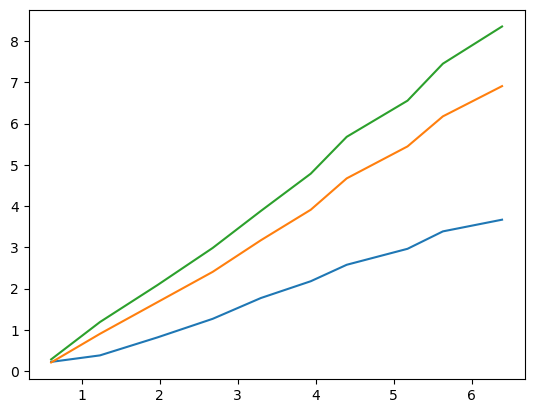

In [203]:
cnn_error_arr = np.array(dist_errors_cnn_list_of_lists)
lstm_error_arr = np.array(dist_errors_lstm_list_of_lists)
transformer_error_arr = np.array(dist_errors_transformer_list_of_lists)
gt_distance = np.array(ground_truth_distance_list_of_lists)

error_cnn_dist_average = np.mean(cnn_error_arr, axis=0)
error_lstm_dist_average = np.mean(lstm_error_arr, axis=0)
error_transformer_dist_average = np.mean(transformer_error_arr, axis=0)
gt_disance_avg = np.median(gt_distance, axis=0)
plt.figure()
#plt.plot(erro_dist_average)
plt.plot(gt_disance_avg, error_cnn_dist_average, label='cnn error')
plt.plot(gt_disance_avg, error_lstm_dist_average, label='lstm error')
plt.plot(gt_disance_avg, error_transformer_dist_average, label='transformer error')


# for idx in range(cnn_error_arr.shape[0]):
#     plt.plot(cnn_error_arr[idx])
# for idx in range(cnn_error_arr.shape[0]):
#     plt.plot(gt_distance[idx], cnn_error_arr[idx])

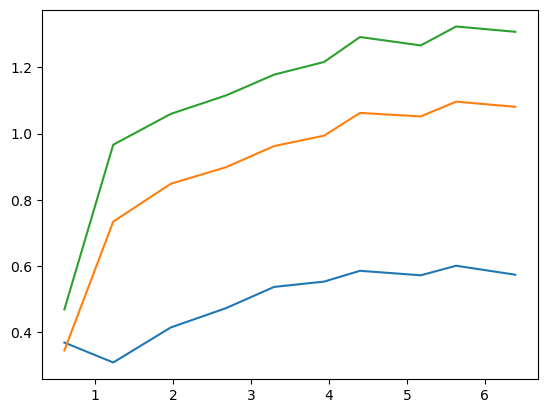

In [204]:
plt.figure()
#plt.plot(erro_dist_average)
plt.plot(gt_disance_avg, error_cnn_dist_average/gt_disance_avg, label='cnn error')
plt.plot(gt_disance_avg, error_lstm_dist_average/gt_disance_avg, label='lstm error')
plt.plot(gt_disance_avg, error_transformer_dist_average/gt_disance_avg, label='transformer error')

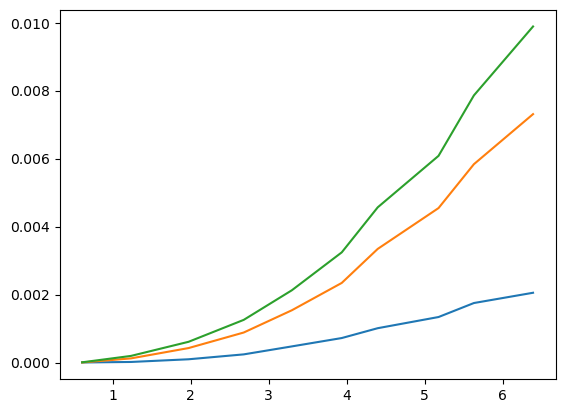

In [205]:


cnn_error_arr = np.array(cnn_mse_error_list_of_lists)
lstm_error_arr = np.array(lstm_mse_error_list_of_lists)
transformer_error_arr = np.array(transformer_mse_error_list_of_lists)
gt_distance = np.array(ground_truth_distance_list_of_lists)

error_cnn_dist_average = np.mean(cnn_error_arr, axis=0)
error_lstm_dist_average = np.mean(lstm_error_arr, axis=0)
error_transformer_dist_average = np.mean(transformer_error_arr, axis=0)
gt_disance_avg = np.median(gt_distance, axis=0)
plt.figure()
#plt.plot(erro_dist_average)
plt.plot(gt_disance_avg, error_cnn_dist_average, label='cnn error')
plt.plot(gt_disance_avg, error_lstm_dist_average, label='lstm error')
plt.plot(gt_disance_avg, error_transformer_dist_average, label='transformer error')

In [206]:
def png_path_to_fig(image_path, main_title=None, num_rows=None, num_cols=None, prop_trim_x=None, prop_trim_y=None, fig_width_scale=1.0, fig_height_scale=1.0):
    # Read the image
    img = mpimg.imread(image_path)
    
    # Get the dimensions of the image
    height, width, _ = img.shape

    if prop_trim_x is not None and prop_trim_y is not None:
        trim_x = int(prop_trim_x * height)
        trim_y = int(prop_trim_y * width)

        img = img[trim_x: -trim_x, trim_y:-trim_y, :]

        height, width, _ = img.shape
    
    # Convert dimensions from pixels to inches (assuming 100 DPI)
    dpi = 100
    fig_width = (width / dpi) * fig_width_scale
    fig_height = (height / dpi) * fig_height_scale
    
    # Check if num_rows and num_cols are specified
    if num_rows is not None and num_cols is not None:
        # Create a figure with the specified number of subplots
        fig, axs = plt.subplots(num_rows, num_cols, figsize=(fig_width, fig_height), dpi=dpi)
        
        # Flatten the axs array if it's 2D for easier indexing
        if num_rows > 1 or num_cols > 1:
            axs = axs.flatten()
        
        # Display the image in the first subplot
        axs[0].imshow(img)
        axs[0].axis('off')
        
        # Add a main title if provided
        if main_title is not None:
            fig.suptitle(main_title)
        
        return fig, axs
    else:
        # Create a figure with the same size as the image
        fig, ax = plt.subplots(figsize=(fig_width, fig_height), dpi=dpi)
        
        # Display the image
        ax.imshow(img)
        ax.axis('off')
        
        # Add a main title if provided
        if main_title is not None:
            fig.suptitle(main_title)
        
        return fig, ax


In [193]:
html_map_path, png_map_path = get_map_image(m, file_base = None, save_map_name = str(100), firefox_dir = None, firefox_binary = None)


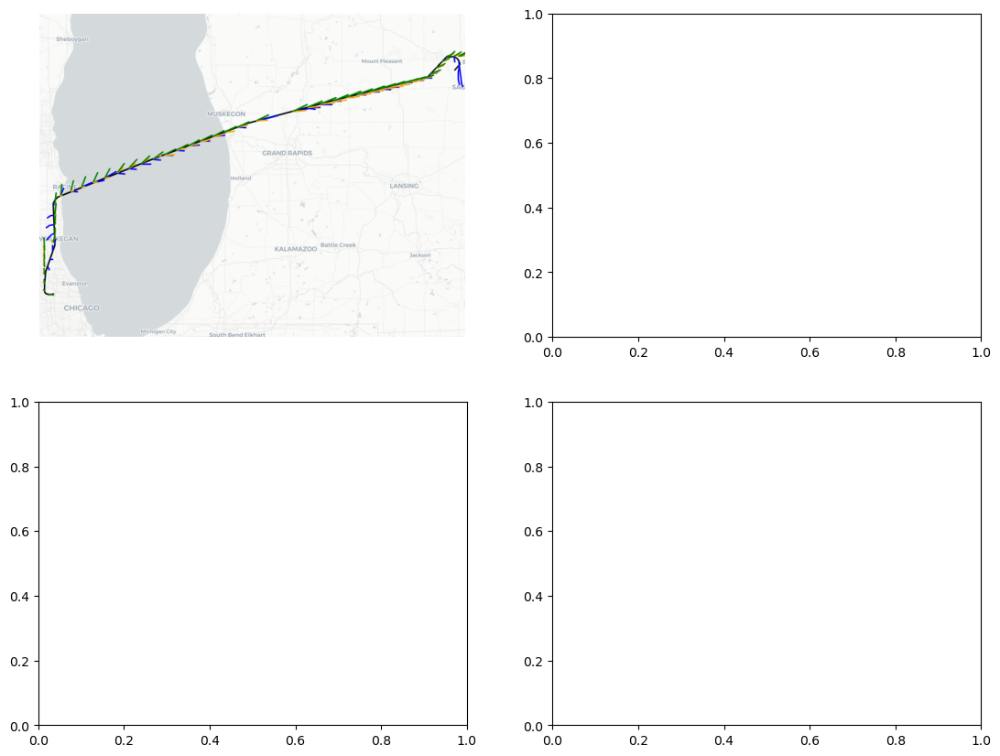

In [201]:
fig, ax = png_path_to_fig(png_map_path, main_title=None, num_rows=2, num_cols=2, prop_trim_x = 0.09, prop_trim_y = 0.23, fig_width_scale=1.8, fig_height_scale=1.8)
#fig, ax = png_path_to_fig(png_map_path, main_title=None, num_rows=2, num_cols=2, prop_trim_x = 0.3, prop_trim_y = 0.3, fig_width_scale=2.8, fig_height_scale=2.8)

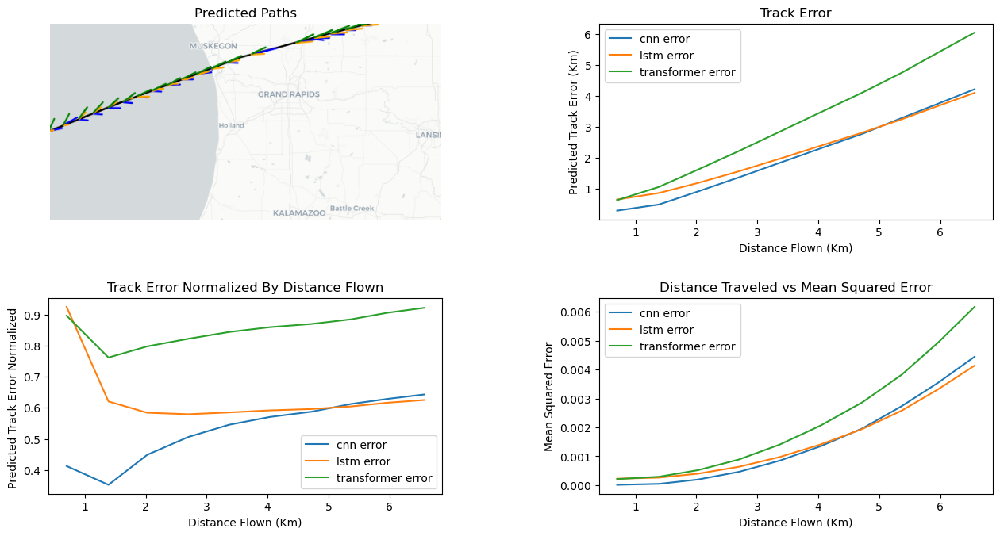

In [199]:
cnn_error_arr = np.array(dist_errors_cnn_list_of_lists)
lstm_error_arr = np.array(dist_errors_lstm_list_of_lists)
transformer_error_arr = np.array(dist_errors_transformer_list_of_lists)
gt_distance = np.array(ground_truth_distance_list_of_lists)

error_cnn_dist_average = np.mean(cnn_error_arr, axis=0)
error_lstm_dist_average = np.mean(lstm_error_arr, axis=0)
error_transformer_dist_average = np.mean(transformer_error_arr, axis=0)
gt_disance_avg = np.median(gt_distance, axis=0)





cnn_error_arr_mse = np.array(cnn_mse_error_list_of_lists)
lstm_error_arr_mse = np.array(lstm_mse_error_list_of_lists)
transformer_error_arr_mse = np.array(transformer_mse_error_list_of_lists)

error_cnn_dist_average_mse = np.mean(cnn_error_arr_mse, axis=0)
error_lstm_dist_average_mse = np.mean(lstm_error_arr_mse, axis=0)
error_transformer_dist_average_mse = np.mean(transformer_error_arr_mse, axis=0)








# ax[0].set_title("Predicted Paths")

# ax[1].plot(gt_disance_avg, error_cnn_dist_average, label='cnn error')
# ax[1].plot(gt_disance_avg, error_lstm_dist_average, label='lstm error')
# ax[1].plot(gt_disance_avg, error_transformer_dist_average, label='transformer error')
# ax[1].set_title("Track Error")
# ax[1].set_xlabel("Distance Flown (Km)")
# ax[1].set_ylabel("Predicted Track Error (Km)")


# ax[2].plot(gt_disance_avg, error_cnn_dist_average/gt_disance_avg, label='cnn error')
# ax[2].plot(gt_disance_avg, error_lstm_dist_average/gt_disance_avg, label='lstm error')
# ax[2].plot(gt_disance_avg, error_transformer_dist_average/gt_disance_avg, label='transformer error')
# ax[2].set_title("Track Error Normalized By Distance Flown")
# ax[2].set_xlabel("Distance Flown (Km)")
# ax[2].set_ylabel("Predicted Track Error Normalized ")


# ax[3].plot(gt_disance_avg, error_cnn_dist_average_mse, label='cnn error')
# ax[3].plot(gt_disance_avg, error_lstm_dist_average_mse, label='lstm error')
# ax[3].plot(gt_disance_avg, error_transformer_dist_average_mse, label='transformer error')
# ax[3].set_title("Distance Traveled vs Mean Squared Error")
# ax[3].set_xlabel("Distance Flown (Km)")
# ax[3].set_ylabel("Mean Squared Error")

# fig.subplots_adjust(wspace=0.4, hspace=0.4)
# # Display the figure
# fig

ax[0].set_title("Predicted Paths")

ax[1].plot(gt_disance_avg, error_cnn_dist_average, label='cnn error')
ax[1].plot(gt_disance_avg, error_lstm_dist_average, label='lstm error')
ax[1].plot(gt_disance_avg, error_transformer_dist_average, label='transformer error')
ax[1].set_title("Track Error")
ax[1].set_xlabel("Distance Flown (Km)")
ax[1].set_ylabel("Predicted Track Error (Km)")
ax[1].legend(loc='best')  # Add legend here

ax[2].plot(gt_disance_avg, error_cnn_dist_average/gt_disance_avg, label='cnn error')
ax[2].plot(gt_disance_avg, error_lstm_dist_average/gt_disance_avg, label='lstm error')
ax[2].plot(gt_disance_avg, error_transformer_dist_average/gt_disance_avg, label='transformer error')
ax[2].set_title("Track Error Normalized By Distance Flown")
ax[2].set_xlabel("Distance Flown (Km)")
ax[2].set_ylabel("Predicted Track Error Normalized ")
ax[2].legend(loc='best')  # Add legend here

ax[3].plot(gt_disance_avg, error_cnn_dist_average_mse, label='cnn error')
ax[3].plot(gt_disance_avg, error_lstm_dist_average_mse, label='lstm error')
ax[3].plot(gt_disance_avg, error_transformer_dist_average_mse, label='transformer error')
ax[3].set_title("Distance Traveled vs Mean Squared Error")
ax[3].set_xlabel("Distance Flown (Km)")
ax[3].set_ylabel("Mean Squared Error")
ax[3].legend(loc='best')  # Add legend here

fig.subplots_adjust(wspace=0.4, hspace=0.4)
# Display the figure
fig




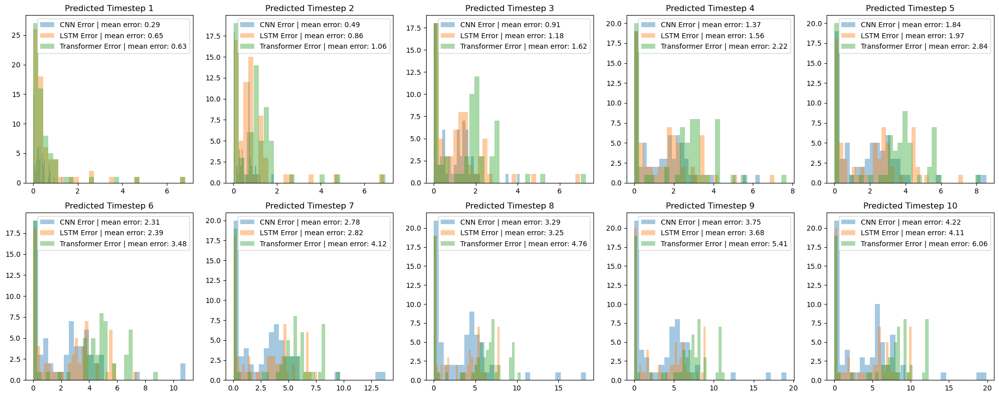

In [200]:
import numpy as np
import matplotlib.pyplot as plt

# Example data
batch_size = 100
timesteps_future = 10
# predictions_model1 = np.random.rand(batch_size, timesteps_future)
# predictions_model2 = np.random.rand(batch_size, timesteps_future)
# predictions_model3 = np.random.rand(batch_size, timesteps_future)

predictions_model1 = np.array(dist_errors_cnn_list_of_lists)
predictions_model2 = np.array(dist_errors_lstm_list_of_lists)
predictions_model3 = np.array(dist_errors_transformer_list_of_lists)

# Create subplots
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()
bins = 30  # Adjusted number of bins for better visibility

for i in range(timesteps_future):
    ax = axes[i]
    mean_cnn_error = np.mean(predictions_model1[:, i])
    mean_lstm_error = np.mean(predictions_model2[:, i])
    mean_transformer_error = np.mean(predictions_model3[:, i])
    ax.hist(predictions_model1[:, i], bins=bins, alpha=0.4, label=f'CNN Error | mean error: {mean_cnn_error:.2f}')
    ax.hist(predictions_model2[:, i], bins=bins, alpha=0.4, label=f'LSTM Error | mean error: {mean_lstm_error:.2f}')
    ax.hist(predictions_model3[:, i], bins=bins, alpha=0.4, label=f'Transformer Error | mean error: {mean_transformer_error:.2f}')
    ax.set_title(f'Predicted Timestep {i+1}')
    ax.legend()

plt.tight_layout()
plt.show()


In [40]:
cnn_error_arr.shape, lstm_error_arr.shape, transformer_error_arr.shape, gt_distance.shape

((56, 10), (56, 10), (56, 10), (56, 10))

In [ ]:
cnn_error_arr = np.array(dist_errors_cnn_list_of_lists)
gt_distance = np.array(ground_truth_distance_list_of_lists)

In [26]:
len(results_dict[tuple_key]["prediction_cnn"]), flightpath_compleate.shape

(1768, (807, 2))

In [126]:
gt_disance_avg

array([0.07377044, 0.14530945, 0.2145117 , 0.28313322, 0.35029518,
       0.42040518, 0.48624092, 0.55574934, 0.62653218, 0.70039544])

In [113]:
np.array(dist_errors_cnn_list_of_lists).shape, np.array(ground_truth_distance_list_of_lists).shape

((145, 10), (145, 10))

In [111]:
dist_errors_cnn_list_of_lists, len(dist_errors_cnn_list_of_lists)

([[0.4219937812308364,
   0.4291874419496725,
   0.4366921787409301,
   0.4427698561767877,
   0.44885566558015555,
   0.45575986830142223,
   0.46186038268599794,
   0.46796810264292943,
   0.4747464597733386,
   0.48101233301762775],
  [0.5106247172646851,
   0.5185748652215703,
   0.5259688361599318,
   0.5337376609799991,
   0.5406419067563051,
   0.5475811606848338,
   0.5539822358236882,
   0.5603748411685321,
   0.5656641123799773,
   0.5710301500433875],
  [0.5943811711972613,
   0.6022889667036395,
   0.6099478134124097,
   0.6168306982958869,
   0.6236571129932948,
   0.6291059235039727,
   0.6334335962105139,
   0.6382272924555406,
   0.6410065764984058,
   0.6421886442300065],
  [0.7064676120870106,
   0.7191950993436383,
   0.7325299415318893,
   0.7451657643651662,
   0.7591631459001624,
   0.772462997602051,
   0.7870862878785304,
   0.8010163394449729,
   0.8148754880884901,
   0.8280835763805964],
  [0.8172532655944391,
   0.8291785502550215,
   0.8403407586261006,
   

In [87]:
next_ground_truth_coor.shape

(1, 2)

In [99]:
num_predictions, flightpath_compleate.shape

(1278, (945, 2))

In [96]:
flightpaths[tuple_key]

,Unnamed: 0,fltKey,CID,UAID,Time,Latitude,Longitude,Altitude,PointSource,RecTypeCat,Significance,GroundSpeed,FlightCourse
0,103655297,164344,36T,EJA151,1715982115,36.08150,-115.16966,21.5,0xE02,1,2,5,70
1,103655298,164344,36T,EJA151,1715982119,36.08153,-115.16956,21.5,0xE02,1,2,5,70
2,103655299,164344,36T,EJA151,1715982120,36.08152,-115.16950,21.5,0xE02,1,2,11,102
3,103655300,164344,36T,EJA151,1715982121,36.08153,-115.16942,21.5,0xE02,1,10,14,81
4,103655301,164344,36T,EJA151,1715982122,36.08154,-115.16935,21.5,0xE02,1,8,12,80
...,...,...,...,...,...,...,...,...,...,...,...,...,...
940,103656237,164344,36T,EJA151,1715985741,33.63794,-111.89314,18.0,AIG200,1,10,117,225
941,103656238,164344,36T,EJA151,1715985746,33.63619,-111.89519,18.0,AIG200,1,5,115,224
942,103656239,164344,36T,EJA151,1715985750,33.63436,-111.89728,17.0,AIG200,1,10,115,224
943,103656240,164344,36T,EJA151,1715985752,33.63358,-111.89814,16.0,AIG200,1,1,117,223


In [82]:
current_position

array([  36.08352, -115.16811])

In [84]:
cnn_prediction.shape

(2, 10)

In [76]:
cnn_prediction.shape, ground_truth.shape

((2, 10), (2, 10))

In [79]:
flightpath_compleate.shape

(945, 2)

In [78]:
cnn_prediction

array([[  36.061577,   36.060543,   36.0595  ,   36.058437,   36.057404,
          36.05637 ,   36.055363,   36.054386,   36.05342 ,   36.052498],
       [-115.175224, -115.17569 , -115.1762  , -115.17672 , -115.17721 ,
        -115.17766 , -115.178055, -115.17843 , -115.17883 , -115.179245]],
      dtype=float32)

In [56]:
tuple_key = ('150171', 'SKW5664')

color_cnn = "green"
color_lstm = "blue"
color_transformer = 'orange'


flightpath_compleate = flightpaths[tuple_key][["Latitude", "Longitude"]].to_numpy()
min_lat, max_lat = np.min(flightpath_compleate[:, 0]), np.max(flightpath_compleate[:, 0])
min_long, max_long = np.min(flightpath_compleate[:, 1]), np.max(flightpath_compleate[:, 1])

m = create_folium_map(min_lat, min_long, max_lat, max_long, border_lat_prop=0.15, border_long_prop=0.15, tiles=None) #"Cartodb dark_matter")
folium.PolyLine(locations=flightpath_compleate, color='black', weight=2.5, opacity=1).add_to(m)


num_predictions = len(results_dict[tuple_key]["prediction_cnn"])
for idx_pred in range(91, num_predictions, 10):
    cnn_prediction = results_dict[tuple_key]["prediction_cnn"][idx_pred][0]
    lstm_prediction = results_dict[tuple_key]["prediction_lstm"][idx_pred][0]
    transformer_prediction = results_dict[tuple_key]["prediction_trasformer"][idx_pred][0]

    folium.PolyLine(locations=cnn_prediction.T, color=color_cnn, weight=2.5, opacity=1).add_to(m)
    folium.PolyLine(locations=lstm_prediction.T, color=color_lstm, weight=2.5, opacity=1).add_to(m)
    folium.PolyLine(locations=transformer_prediction.T, color=color_transformer, weight=2.5, opacity=1).add_to(m)


m


In [52]:
flightpath_compleate.shape

(807, 2)

In [ ]:
flightpath_compleate = flightpath_compleate_pd[["Latitude", "Longitude"]].to_numpy()

timesteps = flightpath_compleate.shape[0]
flightpath_chunk = flightpath_compleate[int(0.5*timesteps): int(0.7*timesteps), :]


min_lat, max_lat = np.min(flightpath_chunk[:, 0]), np.max(flightpath_chunk[:, 0])
min_long, max_long = np.min(flightpath_chunk[:, 1]), np.max(flightpath_chunk[:, 1])

m = create_folium_map(min_lat, min_long, max_lat, max_long, border_lat_prop=0.15, border_long_prop=0.15, tiles=None) #"Cartodb dark_matter")
folium.PolyLine(locations=flightpath_compleate, color='black', weight=2.5, opacity=1).add_to(m)
m

In [58]:
m2 = copy.deepcopy(m)

TypeError: Template.__new__() missing 1 required positional argument: 'source'

In [41]:
# dict_keys(['prediction_cnn', 'prediction_lstm', 'prediction_trasformer', 'chunk_index'])
results_dict[('150171', 'SKW5664')]['chunk_index']

[9, 10, 11, 12, 13, 14, 15]

In [ ]:
# # min_lat, max_lat = np.min(flightpath_chunk[:, 0]), np.max(flightpath_chunk[:, 0])
# # min_long, max_long = np.min(flightpath_chunk[:, 1]), np.max(flightpath_chunk[:, 1])

# m = create_folium_map(min_lat, min_long, max_lat, max_long, border_lat_prop=0.2, border_long_prop=0.15, tiles=None) #"Cartodb dark_matter")
# folium.PolyLine(locations=flightpath_compleate, color='black', weight=2.5, opacity=1).add_to(m)

# for predicted_flightpath in predicted_paths_list:
#     folium.PolyLine(locations=predicted_flightpath, color='blue', weight=2.5, opacity=1).add_to(m)



# m

In [59]:
output_tensor

tensor([[ 28.0092,  28.0071,  28.0051,  28.0030,  28.0009,  27.9988,  27.9968,
          27.9948,  27.9926,  27.9904],
        [-80.7253, -80.7252, -80.7253, -80.7252, -80.7250, -80.7250, -80.7248,
         -80.7250, -80.7250, -80.7248]])

In [ ]:
from collections import defaultdict

# Create a nested defaultdict
nested_dict = defaultdict(lambda: defaultdict(list))

# Dummy tuples
tuples = [
    ('a', 'b'),
    ('a', 'c'),
    ('b', 'c'),
    ('a', 'b'),
    ('b', 'c')
]

# Iterate over the tuples and append values to the nested defaultdict
for t in tuples:
    nested_dict[t]['key1'].append('value1')
    nested_dict[t]['key2'].append('value2')
    nested_dict[t]['key3'].append('value3')

# Print the nested defaultdict to see the result
for key, value in nested_dict.items():
    print(f"{key}: {dict(value)}")


In [30]:
iterative_predictions_tensor_np1

array([[[ 41.97033 ,  41.970306,  41.970276,  41.970253,  41.970222,
          41.9702  ,  41.970173,  41.970142,  41.970116,  41.97009 ],
        [-87.90243 , -87.90237 , -87.902306, -87.902245, -87.90218 ,
         -87.90212 , -87.902054, -87.901985, -87.901924, -87.901855]]],
      dtype=float32)

In [31]:
iterative_predictions_tensor_np2

array([[[ 41.970303,  41.97027 ,  41.97023 ,  41.970192,  41.970154,
          41.970116,  41.970078,  41.97004 ,  41.97    ,  41.969963],
        [-87.902466, -87.90244 , -87.90242 , -87.9024  , -87.902374,
         -87.90235 , -87.90233 , -87.902306, -87.902275, -87.90225 ]]],
      dtype=float32)

In [32]:
d["output_tensor"]

tensor([[ 41.9704,  41.9704,  41.9705,  41.9704,  41.9704,  41.9704,  41.9704,
          41.9704,  41.9704,  41.9704],
        [-87.9024, -87.9024, -87.9024, -87.9024, -87.9023, -87.9023, -87.9022,
         -87.9021, -87.9021, -87.9020]])

In [33]:
41.9704*2, -87.9021*2

(83.9408, -175.8042)

In [22]:
d["input_tensor"]

tensor([[[ 4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
           4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
           4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
           4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
           4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
           4.1974e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,
           4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,
           4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,
           4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,
           4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1972e+01,
           4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,
           4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,
           4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1971e+01,  4.1971e+01,
           4.1971e+01,  4

In [23]:
d.keys()

dict_keys(['input_tensor', 'output_tensor', 'zero_pad_rows', 'chunk_index', 'normalization_tensor', 'meta_flightpath', 'meta_msn', 'meta_flight_id'])

In [24]:

# predicted_paths_list = []
# ground_truth_paths_list = []



# # update the num_rows variable based on the zero-padded tensor
# num_rows, _ = inpput_tensor_zero_padded.shape

# num_tensor_chunks = num_rows - num_input_rows_total - num_output_rows
# indecies_tensor_chunks_shuffled = np.arange(num_tensor_chunks)
# ###np.random.shuffle(indecies_tensor_chunks_shuffled)
# for i in indecies_tensor_chunks_shuffled[100::2][:20]: #range(num_tensor_chunks):
#     input_tensor_chunk = inpput_tensor_zero_padded[i: i + num_input_rows_total].T
#     output_tensor_chunk = output_tensor_zero_padded[i + num_input_rows_total: i + num_input_rows_total + num_output_rows].T
#     ground_truth_chunk = output_tensor_zero_padded[i + num_input_rows_total: i + num_input_rows_total + N_prediction_steps].T
#     ground_truth_chunk_lat_long = predicted_path_complex_to_lat_long_stacked(ground_truth_chunk)

#     current_position_to_next_step_debug = output_tensor_zero_padded[i + num_input_rows_total -1: i + num_input_rows_total + 2].T
#     current_position_to_next_step_debug_lat_long = predicted_path_complex_to_lat_long_stacked(current_position_to_next_step_debug)[0].T # without if check like the other tensors

#     predicted_flightpath_lat_long = input_tensor_chunk_to_predicted_lat_long_path(model, input_tensor_chunk, N_prediction_steps=N_prediction_steps)
#     if len(predicted_flightpath_lat_long.shape) == 3:
#         predicted_flightpath_lat_long = predicted_flightpath_lat_long[0]
#     predicted_flightpath_lat_long = predicted_flightpath_lat_long.T

#     if len(ground_truth_chunk_lat_long.shape) == 3:
#         ground_truth_chunk_lat_long = ground_truth_chunk_lat_long[0]
#     ground_truth_chunk_lat_long = ground_truth_chunk_lat_long.T

#     ###folium.PolyLine(locations=predicted_flightpath_lat_long, color='red', weight=2.5, opacity=1).add_to(m)
#     #folium.PolyLine(locations=ground_truth_chunk_lat_long, color='green', weight=2.5, opacity=1).add_to(m)

#     #folium.PolyLine(locations=current_position_to_next_step_debug_lat_long, color='blue', weight=4.5, opacity=1).add_to(m)

#     predicted_paths_list.append(predicted_flightpath_lat_long)
#     ground_truth_paths_list.append(ground_truth_chunk_lat_long)
    

#     #break

# # Lat bounds on map 
# min_lat_predicted = np.min([np.min(some_flightpath[:, 0]) for some_flightpath in predicted_paths_list])
# min_lat_ground_truth = np.min([np.min(some_flightpath[:, 0]) for some_flightpath in ground_truth_paths_list])
# min_lat = min(min_lat_predicted, min_lat_ground_truth)

# max_lat_predicted = np.amax([np.amax(some_flightpath[:, 0]) for some_flightpath in predicted_paths_list])
# max_lat_ground_truth = np.amax([np.amax(some_flightpath[:, 0]) for some_flightpath in ground_truth_paths_list])
# max_lat = max(max_lat_predicted, max_lat_ground_truth)

# # Long bounds on map 
# min_long_predicted = np.min([np.min(some_flightpath[:, 1]) for some_flightpath in predicted_paths_list])
# min_long_ground_truth = np.min([np.min(some_flightpath[:, 1]) for some_flightpath in ground_truth_paths_list])
# min_long = min(min_long_predicted, min_long_ground_truth)

# max_long_predicted = np.amax([np.amax(some_flightpath[:, 1]) for some_flightpath in predicted_paths_list])
# max_long_ground_truth = np.amax([np.amax(some_flightpath[:, 1]) for some_flightpath in ground_truth_paths_list])
# max_long = max(max_long_predicted, max_long_ground_truth)



# # min_lat, max_lat = np.min(flightpath_chunk[:, 0]), np.max(flightpath_chunk[:, 0])
# # min_long, max_long = np.min(flightpath_chunk[:, 1]), np.max(flightpath_chunk[:, 1])

# m = create_folium_map(min_lat, min_long, max_lat, max_long, border_lat_prop=0.2, border_long_prop=0.15, tiles=None) #"Cartodb dark_matter")
# folium.PolyLine(locations=flightpath_compleate, color='black', weight=2.5, opacity=1).add_to(m)

# for predicted_flightpath in predicted_paths_list:
#     folium.PolyLine(locations=predicted_flightpath, color='blue', weight=2.5, opacity=1).add_to(m)



# m

In [25]:
d = next(flightpath_iter)
d

{'input_tensor': tensor([[ 4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
           4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
           4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
           4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
           4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,  4.1974e+01,
           4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,
           4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,
           4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,
           4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1973e+01,
           4.1973e+01,  4.1973e+01,  4.1973e+01,  4.1972e+01,  4.1972e+01,
           4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,
           4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,  4.1972e+01,
           4.1972e+01,  4.1972e+01,  4.1971e+01,  4.1971e+01,  4.1971e+01,
         

In [26]:
d.keys()

dict_keys(['input_tensor', 'output_tensor', 'zero_pad_rows', 'chunk_index', 'normalization_tensor', 'meta_flightpath', 'meta_msn', 'meta_flight_id'])

In [27]:
d['meta_flightpath']

,Unnamed: 0,fltKey,CID,UAID,Time,Latitude,Longitude,Altitude,PointSource,RecTypeCat,Significance,GroundSpeed,FlightCourse
0,164444875,150171,656,SKW5664,1716075887,41.97372,-87.90504,6.5,0xE02,1,1,5,37
1,164444876,150171,656,SKW5664,1716075888,41.97374,-87.90502,6.5,0xE02,1,1,5,37
2,164444877,150171,656,SKW5664,1716075890,41.97375,-87.90501,6.5,0xE02,1,1,1,37
3,164444878,150171,656,SKW5664,1716075891,41.97376,-87.90499,6.5,0xE02,1,1,4,56
4,164444879,150171,656,SKW5664,1716075892,41.97376,-87.90498,6.5,0xE02,1,1,2,80
...,...,...,...,...,...,...,...,...,...,...,...,...,...
802,164445677,150171,656,SKW5664,1716079237,43.54535,-84.06321,8.0,AIG200,1,10,143,226
803,164445678,150171,656,SKW5664,1716079241,43.54349,-84.06593,8.0,AIG200,1,7,139,227
804,164445679,150171,656,SKW5664,1716079245,43.54149,-84.06864,7.0,AIG200,1,10,141,224
805,164445680,150171,656,SKW5664,1716079250,43.53937,-84.07163,7.0,AIG200,1,1,132,226


In [28]:
msn_initial = 

SyntaxError: invalid syntax (2084470858.py, line 1)